In [1]:
%matplotlib inline

import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import cv2
import os
from skimage.color import rgb2gray
from skimage.filters import sobel
from skimage.segmentation import slic, watershed, join_segmentations
from skimage.segmentation import mark_boundaries
from skimage import color

# SLIC, Watershed и SLIC+Watershed

In [2]:
def SLIC_Watershed(img, n_segments=350, compactness_slic=10, 
                   markers=350, compactness_watershed=0.01, sigma=1):
    
    segments_slic = slic(img, n_segments=n_segments, compactness=compactness_slic, start_label=1, sigma = sigma)
    
    gradient = sobel(rgb2gray(img))
    segments_watershed = watershed(gradient, markers=markers, compactness=compactness_watershed)
    
    return segments_slic, segments_watershed, join_segmentations(segments_slic, segments_watershed)

In [3]:
path = '/Users/elizavetashpilko/Downloads/Geo' #папка с фотографиями шлифов
path_to_save = '/Users/elizavetashpilko/Downloads/Geo_done' #куда сохраняем

ss_list, sw_list, sj_list = [], [], []
img_initial = []

for name in os.listdir(path):

    img = cv2.imread(path+'/'+name)
    img_initial.append(img)
    
    
    if '2,5' in name: #параметры сегментации меняются в зависимости от приближения изображения шлифа
        
        segments_slic, segments_watershed, segments_join = SLIC_Watershed(img.astype(np.float64), 
                                                                          n_segments=1500, markers=1500)
        
    else:
        
        segments_slic, segments_watershed, segments_join = SLIC_Watershed(img.astype(np.float64))
        
    ss_list.append(segments_slic)
    sw_list.append(segments_watershed)
    sj_list.append(segments_join)

In [4]:
name_segm = ['SLIC', 'Watershed', 'SLIC+Watershed']

## Визуализация

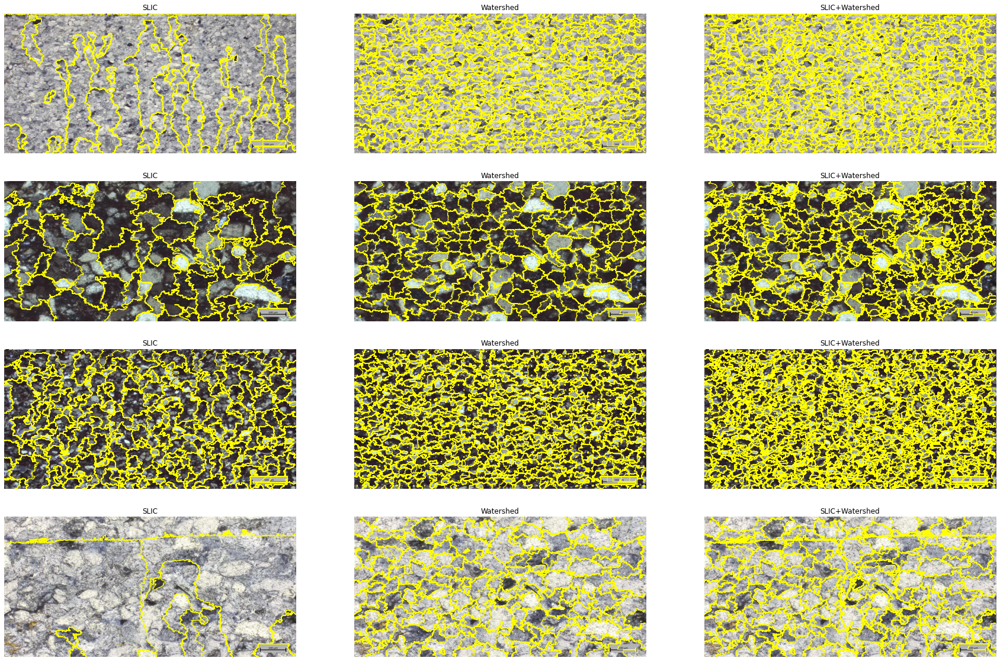

In [49]:
fig, ax = plt.subplots(4, 3, figsize=(30, 20),sharex=True, sharey=True)

for i in range(12):
    
    ax[i//3, i%3].imshow(img_initial[i//3], aspect='auto')
    
    if i % 3 == 0:
        
        ax[i//3, i%3].contour(ss_list[i//3], levels=np.unique(ss_list[i//3]), colors='yellow', linewidths=1)
    
    elif i % 3 == 1:
        
        ax[i//3, i%3].contour(sw_list[i//3], levels=np.unique(sw_list[i//3]), colors='yellow', linewidths=1)
    
    else:
        
        ax[i//3, i%3].contour(sj_list[i//3], levels=np.unique(sj_list[i//3]), colors='yellow', linewidths=1)
    
    ax[i//3, i%3].set_axis_off()
    ax[i//3, i%3].set_title(name_segm[i%3])
    
plt.savefig(path_to_save + '/Segmentations.jpg', bbox_inches='tight', dpi=1000)

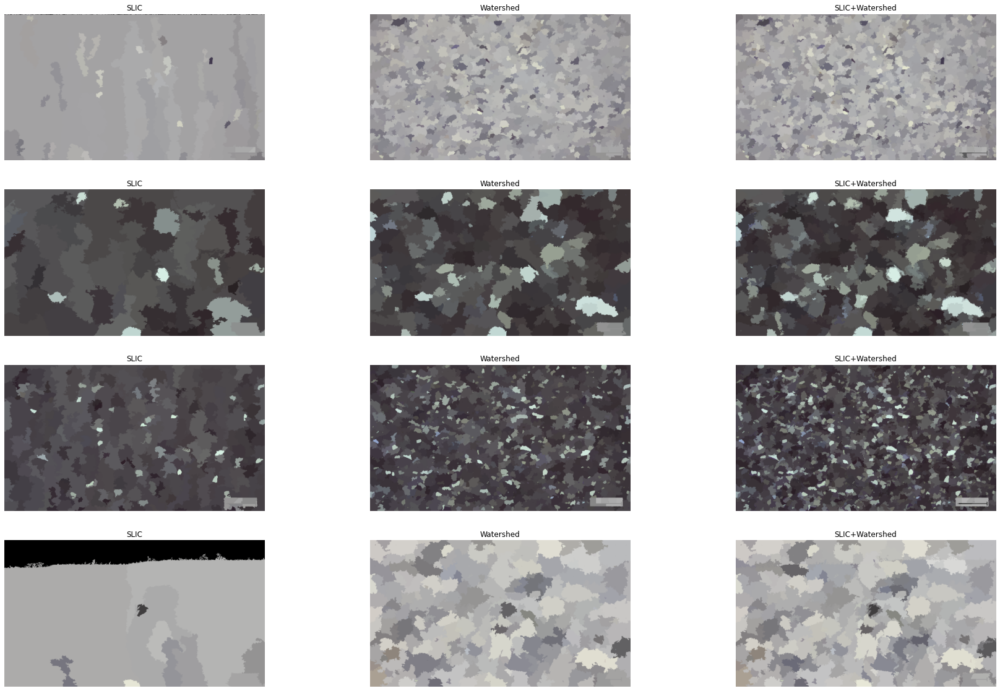

In [50]:
fig, ax = plt.subplots(4, 3, figsize=(30, 20),sharex=True, sharey=True)

for i in range(12):
    
    if i % 3 == 0:
        
        out1 = color.label2rgb(ss_list[i//3], img_initial[i//3], kind='avg', bg_label=0)
        ax[i//3, i%3].imshow(out1)
        
    elif i % 3 == 1:
        
        out1 = color.label2rgb(sw_list[i//3], img_initial[i//3], kind='avg', bg_label=0)
        ax[i//3, i%3].imshow(out1)
        
    else:
        
        out1 = color.label2rgb(sj_list[i//3], img_initial[i//3], kind='avg', bg_label=0)
        ax[i//3, i%3].imshow(out1)
        
    ax[i//3, i%3].set_axis_off()
    ax[i//3, i%3].set_title(name_segm[i%3])
    
plt.savefig(path_to_save + '/Colored Segmentations.jpg', bbox_inches='tight', dpi=1000)

## Объединить сегментации по изображениям с одинаковым увеличением

In [5]:
wpw_x10 = join_segmentations(sw_list[1], sw_list[3])
wpw_x2 = join_segmentations(sw_list[0], sw_list[2])

sps_x10 = join_segmentations(ss_list[1], ss_list[3])
sps_x2 = join_segmentations(ss_list[0], ss_list[2])

jpj_x10 = join_segmentations(sj_list[1], sj_list[3])
jpj_x2 = join_segmentations(sj_list[0], sj_list[2])

In [11]:
wpw, sps, jpj = [wpw_x10, wpw_x2], [sps_x10, sps_x2], [jpj_x10, jpj_x2]

img_initial_join = [(img_initial[1]+img_initial[3])/2., (img_initial[0]+img_initial[2])/2.]

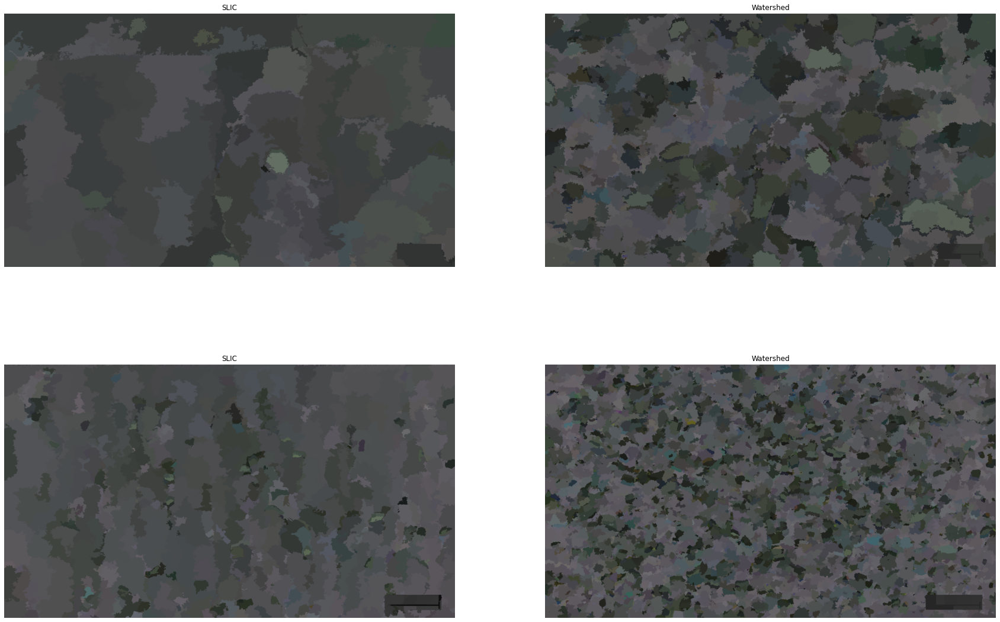

In [16]:
fig, ax = plt.subplots(2, 2, figsize=(30, 20),sharex=True, sharey=True)

for i in range(4):
    
    if i % 2 == 0:
        
        out1 = color.label2rgb(sps[i//2], img_initial_join[i//2].astype(np.uint8), kind='avg', bg_label=0)
        ax[i//2, i%2].imshow(out1)
        
    elif i % 2 == 1:
        
        out1 = color.label2rgb(wpw[i//2], img_initial_join[i//2].astype(np.uint8), kind='avg', bg_label=0)
        ax[i//2, i%2].imshow(out1)
        
    ax[i//2, i%2].set_axis_off()
    ax[i//2, i%2].set_title(name_segm[i%2])
    
plt.savefig(path_to_save + '/Colored Segmentations 2 joined.jpg', bbox_inches='tight', dpi=1000)

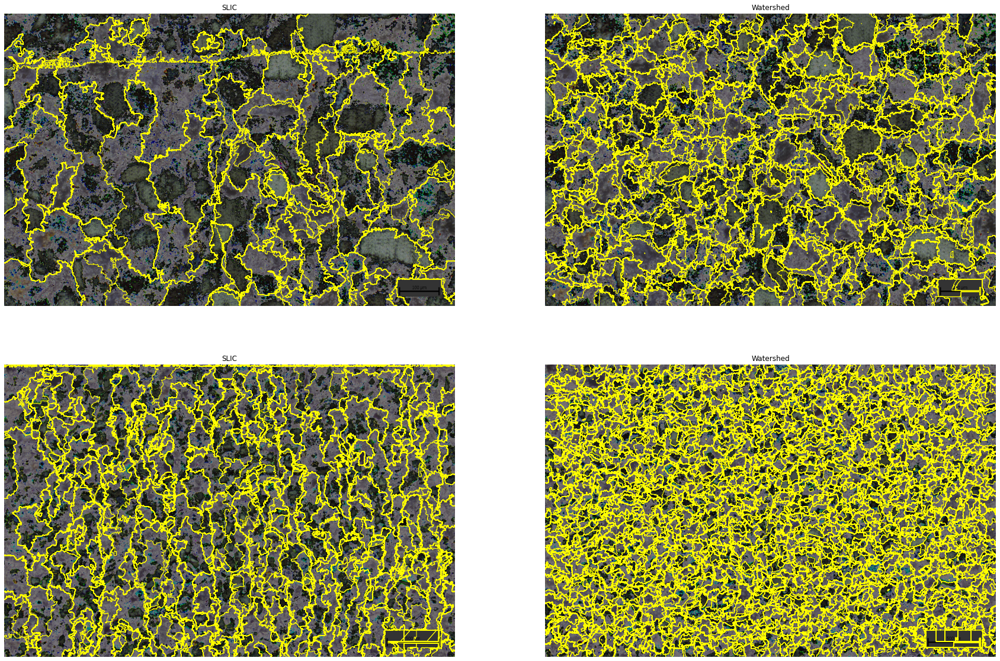

In [19]:
fig, ax = plt.subplots(2, 2, figsize=(30, 20),sharex=True, sharey=True)

for i in range(4):
    
    ax[i//2, i%2].imshow(img_initial_join[i//2].astype(np.uint8), aspect='auto')
    
    if i % 2 == 0:
        
        ax[i//2, i%2].contour(sps[i//2], levels=np.unique(sps[i//2]), colors='yellow', linewidths=1)
    
    elif i % 2 == 1:
        
        ax[i//2, i%2].contour(wpw[i//2], levels=np.unique(wpw[i//2]), colors='yellow', linewidths=1)
    
    
    ax[i//2, i%2].set_axis_off()
    ax[i//2, i%2].set_title(name_segm[i%2])
    
plt.savefig(path_to_save + '/Segmentations 2 joined.jpg', bbox_inches='tight', dpi=1000)